In [3]:
import pandas as pd
import numpy as np
import sys
import re
from functools import reduce
from typing import Dict
from pandas.tseries.offsets import MonthEnd
from datetime import datetime
import re
import plotly.express as px
from itertools import chain
from pandas.tseries.offsets import MonthEnd
from dateutil.relativedelta import relativedelta
pd.set_option('display.max_columns', 200)

In [4]:
#!pip install scikit-learn --force
#!pip install catboost

In [8]:
data_path = '../data/'
df = pd.read_parquet(data_path + 'price_df.parquet')
kr = pd.read_excel(data_path + 'cb_data.xlsx', dtype = {'Дата': 'str'})

C:\Users\DNS\anaconda3\lib\site-packages\openpyxl\styles\stylesheet.py:226: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")


In [15]:
delete_objects_after_sale = True
if delete_objects_after_sale:
    df = df.sort_values('report_date').groupby('objectid', as_index = False).apply(lambda df: df[(df['S_share'] >= 1).cumsum() < 2]).reset_index(drop =True)

In [9]:
def anomaly_detect(df, cols, fill = False):
    for col in cols:
        q25 = df[col].quantile(0.25)
        q75 = df[col].quantile(0.75)
        IQR = q75 - q25
        if fill:
            get_val = lambda arr, f: arr.agg(f) if len(arr) > 0 else None
            df.loc[:, col] = df[col].mask(df[col] < q25 - 1.5*IQR, get_val(df[col][df[col] >= q25 - 1.5*IQR], 'min'))
            df.loc[:, col] = df[col].mask(df[col] > q75 + 1.5*IQR, get_val(df[col][df[col] <= q75 + 1.5*IQR], 'max'))
        else:   
            df = df[df[col].between(q25 - 1.5*IQR, q75 + 1.5*IQR)]
    return df

px.histogram(df.groupby('objectid').apply(lambda df: anomaly_detect(df, ['mean_price'], True)), x = 'mean_price')

In [10]:
px.histogram(df['mean_price'])

In [11]:
def gen_features(df, kr, ffill_kr_months = 0, return_selected_features = True, ln = False):
    kr = kr.assign(report_date = kr['Дата'].map(lambda dt: datetime(*[int(dt_) for dt_ in reversed(dt.split('.'))], 1) + MonthEnd(0))).rename(
                                                            columns = {'Ключевая ставка, % годовых': 'key_rate'}).sort_values('report_date')
    if ffill_kr_months:

        kr = pd.concat([kr, pd.DataFrame({'report_date': pd.date_range(kr['report_date'].max() + MonthEnd(1), 
                                         kr['report_date'].max() + MonthEnd(ffill_kr_months), freq = 'M'),
                                          'key_rate': kr.loc[kr['report_date'] == kr['report_date'].max(), 'key_rate'].values[0]})])                                
    kr = kr.sort_values('report_date').assign(key_rate_diff = kr['key_rate'].diff().fillna(0))
    kr = kr.assign(**{f'key_rate-key_rate_mean_{period}': kr['key_rate'] - kr['key_rate'].shift(1).rolling(period).mean() for period in [3, 6, 12]})
    kr = kr[['report_date', *[col for col in kr.columns if col.startswith('key')]]]
    
    df = df.groupby('objectid').apply(lambda df: anomaly_detect(df, ['mean_price'], True))
    df = df.merge(kr, on = 'report_date', how = 'left')
    price_cols = ['mean_price', 'mean_price_per_metr']
    df = df.sort_values('report_date').groupby('objectid').apply(lambda df: df.assign(**{rd_col: df[col].interpolate().ffill().bfill() for 
                                                                                         col, rd_col in zip(price_cols, ['mean_price', 'target_price_pm'])},
                                                    combine_price = df['mean_price_per_metr'].interpolate().fillna(df['mean_price']).ffill().bfill()
                                                                                     )
                                                                ).reset_index(drop = True).drop(columns =)
    get_normalized = lambda arr: (arr - np.mean(arr)) / np.std(arr, ddof = 1)
    df = df.sort_values('report_date').groupby('objectid').apply(lambda df: df.assign(months_num = df.shape[0],
                                                                                      months_after_open = get_normalized(np.arange(0, df.shape[0])),
                                                                                      months_before_close = get_normalized(np.arange(df.shape[0]-1, -1, -1)),
                                                                                      share_months_to_close = np.arange(0, df.shape[0])/(df.shape[0] - 1),
                                                                                      december_flg = (df['report_date'].map(lambda dt: dt.month == 12)).astype('int'),
                                                                                      december_nums = df['report_date'].map(lambda dt: dt.month == 12).cumsum(),
                                                                                      **{f'{col}_shift3': df[col].shift(3).bfill() for col in ['combine_price', 'mean_price']},
                                                                    
                                            S_share_shift_3 = df['S_share'].shift(3).fillna(0),#.fillna(df['S_share'].shift(2)).fillna(df['S_share'].shift(1)).fillna(df['S_share'])
                                            S_share_shift3_diff_mean3 = df['S_share'].shift(3).diff().rolling(3).mean().fillna(0),
                                            S_share_shift3_diff = df['S_share'].shift(3).diff().fillna(0),
                                            S_share_shift3_diff2 = df['S_share'].shift(3).diff(2).fillna(0),   
                                            S_share_shift3_diff3 = df['S_share'].shift(3).diff(3).fillna(0),                                        
                                                                                     )).reset_index(drop = True)
    
    f = lambda df: np.log1p(df) if ln else df
        
    df = df.sort_values('report_date').groupby('objectid').apply(lambda df: df.assign(**{f'{col}_shift3_diff{period}': (f(df[col].shift(3)) - f(df[col].shift(4).rolling(period).mean())).fillna(0)
                                                                                          for col in ['combine_price', 'mean_price'] for period in [1, 3, 6, 12]})).reset_index(drop = True)
    
    df = df.fillna({'mean_price_shift3': df['combine_price_shift3']}) # для некоторых объектов не нашлось ближайших :(                                                                            
    feature_cols = ['report_date', 'objectid', 'december_nums',
                    *[col for col in df.columns if col.startswith('key') or ('shift' in col) or ('months' in col)]]
    target_cols = ['target_price_pm']
    
    if ln:
        df = df.assign(**{col: np.log1p(df[col]) for col in df.columns if ('price' in col) and ('diff' not in col)})
        
    if return_selected_features:
        df = df[[*feature_cols, *target_cols]]
        
    return df



In [12]:
#for _, df_ in list(gen_features(df, kr, True).groupby(['objectid']))[:20]:
#    display(df_)
#    px.line(df_.sort_values('report_date'), x = 'report_date', y = ['combine_price_shift3', 'mean_price_shift3', 'target_price_pm']).show()

In [14]:
gen_features(df, kr, return_selected_features=True) 

,report_date,objectid,december_nums,key_rate,key_rate_diff,key_rate-key_rate_mean_3,key_rate-key_rate_mean_6,key_rate-key_rate_mean_12,months_num,months_after_open,months_before_close,share_months_to_close,combine_price_shift3,mean_price_shift3,S_share_shift_3,S_share_shift3_diff_mean3,S_share_shift3_diff,S_share_shift3_diff2,S_share_shift3_diff3,combine_price_shift3_diff1,combine_price_shift3_diff3,combine_price_shift3_diff6,combine_price_shift3_diff12,mean_price_shift3_diff1,mean_price_shift3_diff3,mean_price_shift3_diff6,mean_price_shift3_diff12,target_price_pm
0,2019-01-31,1802.0,0,7.75,0.0,0.166667,0.291667,0.333333,36,-1.661026,1.661026,0.000000,49766.597215,49766.597215,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,53990.157676
1,2019-02-28,1802.0,0,7.75,0.0,0.083333,0.208333,0.333333,36,-1.566111,1.566111,0.028571,49766.597215,49766.597215,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,53990.157676
2,2019-03-31,1802.0,0,7.75,0.0,0.000000,0.125000,0.312500,36,-1.471195,1.471195,0.057143,49766.597215,49766.597215,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,53990.157676
3,2019-04-30,1802.0,0,7.75,0.0,0.000000,0.083333,0.270833,36,-1.376279,1.376279,0.085714,49766.597215,49766.597215,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,53990.157676
4,2019-05-31,1802.0,0,7.75,0.0,0.000000,0.041667,0.229167,36,-1.281363,1.281363,0.114286,49766.597215,49766.597215,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,53990.157676
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21158,2023-10-31,46217.0,2,15.00,2.0,3.833333,5.666667,6.583333,27,1.133893,-1.133893,0.846154,76593.244394,76593.244394,0.358602,0.071251,0.111629,0.173076,0.213753,1169.396303,-468.172286,-800.544095,225.677418,0.0,0.0,0.0,0.0,81327.036862
21159,2023-11-30,46217.0,2,15.00,0.0,1.666667,4.416667,5.958333,27,1.259882,-1.259882,0.884615,82655.630247,82655.630247,0.425424,0.079966,0.066822,0.178451,0.239897,6062.385853,6635.514375,5829.634359,6183.738360,0.0,0.0,0.0,0.0,83414.835506
21160,2023-12-31,46217.0,3,16.00,1.0,1.666667,4.166667,6.333333,27,1.385870,-1.385870,0.923077,80389.305542,80389.305542,0.540242,0.097756,0.114818,0.181640,0.293269,-2266.324705,2165.064631,2344.262190,3307.889923,0.0,0.0,0.0,0.0,84384.011911
21161,2024-01-31,46217.0,3,16.00,0.0,0.666667,2.750000,5.625000,27,1.511858,-1.511858,0.961538,81327.036862,81327.036862,0.607340,0.082913,0.067098,0.181916,0.248738,937.731320,1447.643468,2856.631825,3824.957903,0.0,0.0,0.0,0.0,75341.345463


In [10]:
from sklearn.model_selection import TimeSeriesSplit
from catboost import cv
from catboost import Pool

In [12]:
def CustomSplit(df, n_splits = 5, test_size = 3, date_col = 'report_date', freq = 'M'):
    df = df.reset_index(drop = True)
    dates = pd.date_range(df[date_col].min(), df[date_col].max(), freq = freq)
    tscv = TimeSeriesSplit(n_splits = n_splits, test_size = test_size)
    return iter([[df[df[date_col].isin(dates[train_idx])].index, df[df[date_col].isin(dates[test_idx])].index] for train_idx, test_idx in tscv.split(dates)])

data = gen_features(df, kr, return_selected_features=True) 


df_train, df_test = data[data['report_date'] <= pd.to_datetime('2023-12-31')], data[data['report_date'] > pd.to_datetime('2023-12-31')]

drop_cols, target_cols = ['report_date', 'objectid', 'key_rate-key_rate_mean_6', 'key_rate-key_rate_mean_12', 'months_after_open',
                         'S_share_shift3_diff2', 'S_share_shift3_diff3', 'combine_price_shift3_diff6', 'combine_price_shift3_diff12',
                         'mean_price_shift3_diff6', 'mean_price_shift3_diff12',
                         ], ['target_price_pm']
X_train, y_train = df_train.drop(columns = [*drop_cols, *target_cols]), df_train[target_cols]


class SigmoidMaeObjective(object):
    def calc_ders_range(self, approxes, targets, weights):
        assert len(approxes) == len(targets)
        if weights is not None:
            assert len(weights) == len(approxes)
        
        result = []
        for index in range(len(targets)):
            der1 = targets[index] - approxes[index]
            der2 = -1
            der1 = np.sign(targets[index] - 1 / (1 + np.exp(-approxes[index]))) * np.exp(-approxes[index]) / ((1 + np.exp(-approxes[index]))**2)
            der2 = np.sign(targets[index] - 1 / (1 + np.exp(-approxes[index]))) * \
                    (2*np.exp(-2*approxes[index]) / ((1 + np.exp(-approxes[index]))**3) - np.exp(-approxes[index]) / ((1 + np.exp(-approxes[index]))**2))

            if weights is not None:
                der1 *= weights[index]
                der2 *= weights[index]

            result.append((der1, der2))
        return result


class SigmoidMaeMetric(object):
    def get_final_error(self, error, weight):
        return error / (weight + 1e-38)

    def is_max_optimal(self):
        return False

    def evaluate(self, approxes, target, weight):
        assert len(approxes) == 1
        assert len(target) == len(approxes[0])

        approx = approxes[0]

        error_sum = 0.0
        weight_sum = 0.0

        for i in range(len(approx)):
            w = 1.0 if weight is None else weight[i]
            weight_sum += w
            error_sum += w * abs(target[i] - 1 / (1 + np.exp(-approx[i])))

        return error_sum, weight_sum



params = {
    'eval_metric': 'RMSE',#SigmoidMaeMetric(),
    'loss_function': 'RMSE'#SigmoidMaeObjective()
}

cv_dataset = Pool(data=X_train,
                  label=y_train, cat_features=[]) #'quartal'


iter_scores = cv(cv_dataset,
                 params = params,
                 plot=True,
                 verbose = False,
                 folds=CustomSplit(df_train),
                 return_models = True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Training on fold [0/5]

bestTest = 36762.99016
bestIteration = 999

Training on fold [1/5]

bestTest = 39477.81732
bestIteration = 999

Training on fold [2/5]

bestTest = 36374.71802
bestIteration = 191

Training on fold [3/5]

bestTest = 41672.75578
bestIteration = 999

Training on fold [4/5]

bestTest = 42526.10076
bestIteration = 352



## Feature analysys

In [12]:
#pip install shap

In [13]:
from sklearn.metrics import mean_absolute_error as mae, mean_absolute_percentage_error as mape, mean_squared_error as mse

In [22]:
list(CustomSplit(df_train))[-1][0]

Int64Index([    0,     1,     2,     3,     4,     5,     6,     7,     8,
                9,
            ...
            18861, 18862, 18863, 18864, 18865, 18866, 18867, 18868, 18869,
            18870],
           dtype='int64', length=18871)

In [23]:
X_train.loc[list(CustomSplit(df_train))[-1][0], :]

,december_nums,key_rate,key_rate_diff,key_rate-key_rate_mean_3,months_num,months_before_close,share_months_to_close,combine_price_shift3,mean_price_shift3,S_share_shift_3,S_share_shift3_diff_mean3,S_share_shift3_diff,combine_price_shift3_diff1,combine_price_shift3_diff3,mean_price_shift3_diff1,mean_price_shift3_diff3
0,0,7.75,0.0,0.166667,36,1.661026,0.000000,49766.597215,49766.597215,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
1,0,7.75,0.0,0.166667,27,1.637846,0.000000,87299.453224,87299.453224,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
2,0,7.75,0.0,0.166667,62,1.690536,0.000000,49497.940170,49497.940170,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
3,0,7.75,0.0,0.166667,56,1.686133,0.000000,107374.359454,107374.359454,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
4,0,7.75,0.0,0.166667,37,1.662917,0.000000,79342.551918,79342.551918,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18866,4,13.00,-2.0,3.666667,59,-1.572001,0.965517,81951.335312,76756.941833,0.563773,0.018984,0.027825,12849.393564,6754.514611,0.0,0.0
18867,3,13.00,-2.0,3.666667,39,-1.403293,0.921053,79164.308176,118700.508120,0.827621,0.007311,0.012172,4749.602294,8483.381494,0.0,0.0
18868,4,13.00,-2.0,3.666667,60,-1.402866,0.915254,115000.000000,166744.304858,0.020344,0.006781,0.000000,0.000000,-19068.324604,0.0,0.0
18869,2,13.00,-2.0,3.666667,31,-1.099853,0.833333,85126.169278,115464.302252,0.368386,0.026177,0.036709,-2246.912727,-449.068006,0.0,0.0


In [24]:
import shap
# creating an explainer for our model
explainer = shap.TreeExplainer(iter_scores[1][-1]) # we only need to pass our  fitted model to tree explainer. 
                                    #No background dataset in 'data' argument required for tree models as it
                                    #is automatically received through the model tree object.

# finding out the shap values using the explainer
X_train_, X_test_ = X_train.loc[list(CustomSplit(df_train))[-1][0], :], X_train.loc[list(CustomSplit(df_train))[-1][1], :]
shap_values = explainer.shap_values(X_train_)

# Expected/Base/Reference value = the value that would be predicted if we didn’t know any features of the current output”
print('Expected Value:', explainer.expected_value)


Expected Value: 122931.67816490005


In [25]:
shap.initjs()
shap.force_plot(explainer.expected_value,
shap_values[155,:], X_train.iloc[155])

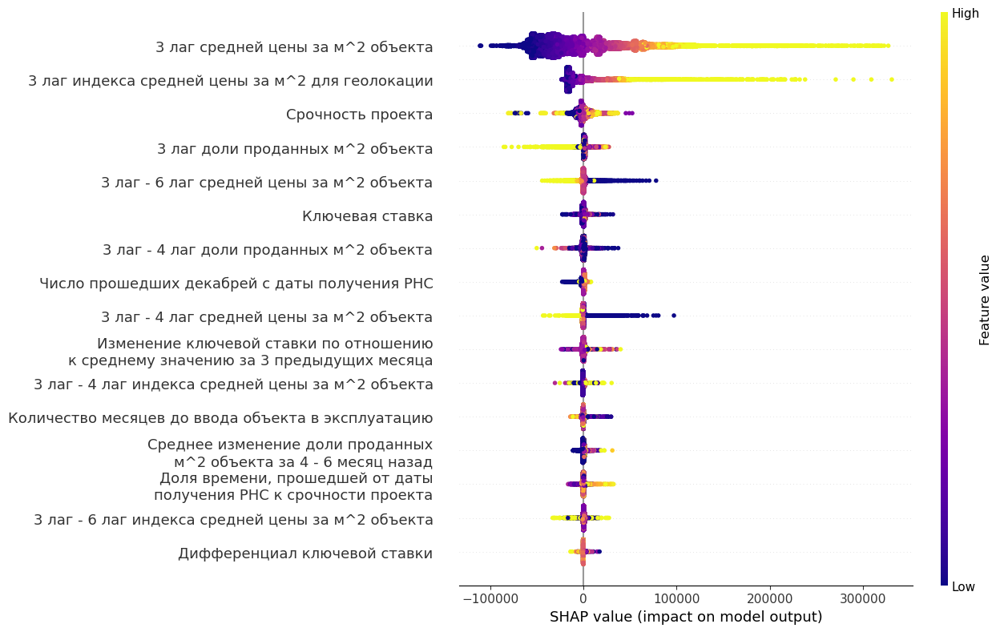

In [201]:
shap.initjs()
shap_values = explainer.shap_values(X_train_)
shap.summary_plot(shap_values, X_train_.rename(columns = {k: v for k, v in zip(X_train_.columns, 
                                                                              ['Число прошедших декабрей с даты получения РНС',
                         'Ключевая ставка',
                         'Дифференциал ключевой ставки',
                         'Изменение ключевой ставки по отношению\nк среднему значению за 3 предыдущих месяца',
                         'Срочность проекта',
                         'Количество месяцев до ввода объекта в эксплуатацию',
                         'Доля времени, прошедшей от даты\nполучения РНС к срочности проекта',
                         '3 лаг средней цены за м^2 объекта',
                         '3 лаг индекса средней цены за м^2 для геолокации',
                         '3 лаг доли проданных м^2 объекта',
                         'Среднее изменение доли проданных\nм^2 объекта за 4 - 6 месяц назад',
                         '3 лаг - 4 лаг доли проданных м^2 объекта',
                         '3 лаг - 4 лаг средней цены за м^2 объекта',
                         '3 лаг - 6 лаг средней цены за м^2 объекта',
                         '3 лаг - 4 лаг индекса средней цены за м^2 объекта',
                         '3 лаг - 6 лаг индекса средней цены за м^2 объекта'
                         ])}), cmap = 'plasma', plot_size = (13,8), show = False)

fig, ax = plt.gcf(), plt.gca()
fig.savefig('shaps.png', dpi = 500)

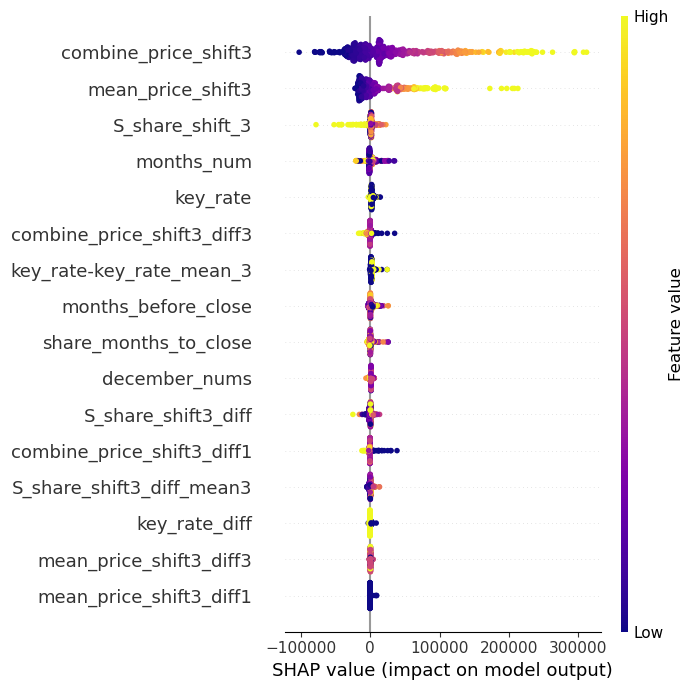

In [187]:
shap.initjs()
shap_values = explainer.shap_values(X_test_)
explainer.feature_names = ['Число прошедших декабрей с даты получения РНС',
                         'Ключевая ставка',
                         'Дифференциал ключевой ставки',
                         'Изменение ключевой ставки по отношению\nк среднему значению за 3 предыдущих месяца',
                         'Срочность проекта',
                         'Количество месяцев до ввода объекта в эксплуатацию',
                         'Доля времени, прошедшей от даты\nполучения РНС к срочности проекта',
                         '3 лаг средней цены за м^2 объекта',
                         '3 лаг индекса средней цены за м^2 для геолокации',
                         '3 лаг доли проданных м^2 объекта',
                         'Среднее изменение доли проданных\nм^2 объекта за 4 - 6 месяц назад',
                         '3 лаг - 4 лаг доли проданных м^2 объекта',
                         '3 лаг - 4 лаг средней цены за м^2 объекта',
                         '3 лаг - 6 лаг средней цены за м^2 объекта',
                         '3 лаг - 4 лаг индекса средней цены за м^2 объекта',
                         '3 лаг - 6 лаг индекса средней цены за м^2 объекта'
                         ]
shap.summary_plot(shap_values, X_test_, cmap = 'plasma', plot_size = (7,7))

In [33]:
exp = shap.Explainer(lambda x: iter_scores[1][-1].predict(x), X_train_)(X_train_)

Permutation explainer: 18872it [13:37, 22.86it/s]                           


In [79]:
import matplotlib.pyplot as plt
from copy import deepcopy

In [166]:
def get_shap_scatter(exp, feature, colorbar_title = None, **kwargs):
    exp = deepcopy(exp)
    exp.feature_names = ['Число прошедших декабрей с даты получения РНС',
                         'Ключевая ставка',
                         'Дифференциал ключевой ставки',
                         'Изменение ключевой ставки по отношению\nк среднему значению за 3 предыдущих месяца',
                         'Срочность проекта',
                         'Количество месяцев до ввода объекта в эксплуатацию',
                         'Доля времени, прошедшей от даты\nполучения РНС к срочности проекта',
                         '3 лаг средней цены за м^2 объекта',
                         '3 лаг индекса средней цены за м^2 для геолокации',
                         '3 лаг доли проданных м^2 объекта',
                         'Среднее изменение доли проданных\nм^2 объекта за 4 - 6 месяц назад',
                         '3 лаг - 4 лаг доли проданных м^2 объекта',
                         '3 лаг - 4 лаг средней цены за м^2 объекта',
                         '3 лаг - 6 лаг средней цены за м^2 объекта',
                         '3 лаг - 4 лаг индекса средней цены за м^2 объекта',
                         '3 лаг - 6 лаг индекса средней цены за м^2 объекта'
                         ]
    shap.plots.scatter(exp[:, feature], color = y_train.loc[list(CustomSplit(df_train))[-1][0], :].iloc[:, 0].values if colorbar_title is None else exp[:,colorbar_title], show = False, **kwargs)
    fig, ax = plt.gcf(), plt.gca()
    if colorbar_title is None:
        fig.axes[-2].set_ylabel('Средняя цена за квадратный метр')
    return fig

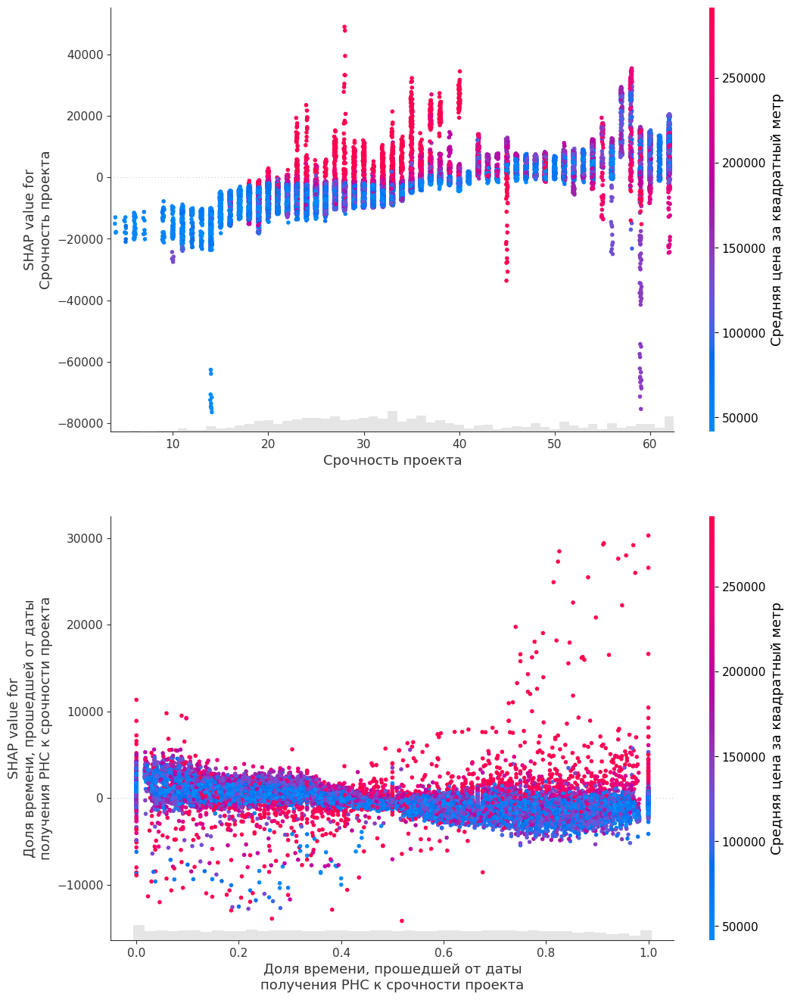

In [181]:
fig, axs = plt.subplots(2, 1, figsize = (12, 16))
 
get_shap_scatter(exp, 'Срочность проекта', ax = axs[0])
get_shap_scatter(exp, 'Доля времени, прошедшей от даты\nполучения РНС к срочности проекта', ax = axs[1])
fig.savefig('time.png', dpi = 500)

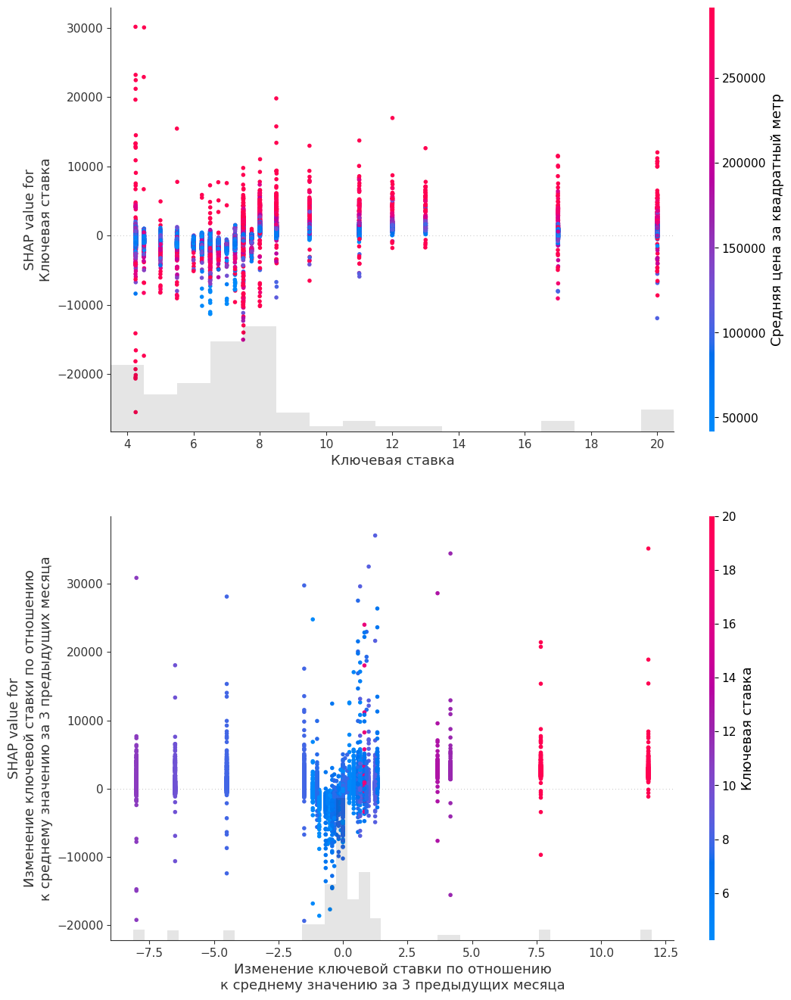

In [182]:
fig, axs = plt.subplots(2, 1, figsize = (12, 16))
 
get_shap_scatter(exp, 'Ключевая ставка', ax = axs[0])
get_shap_scatter(exp, 'Изменение ключевой ставки по отношению\nк среднему значению за 3 предыдущих месяца', 'Ключевая ставка', ax = axs[1])
fig.savefig('key_rate.png', dpi = 500)

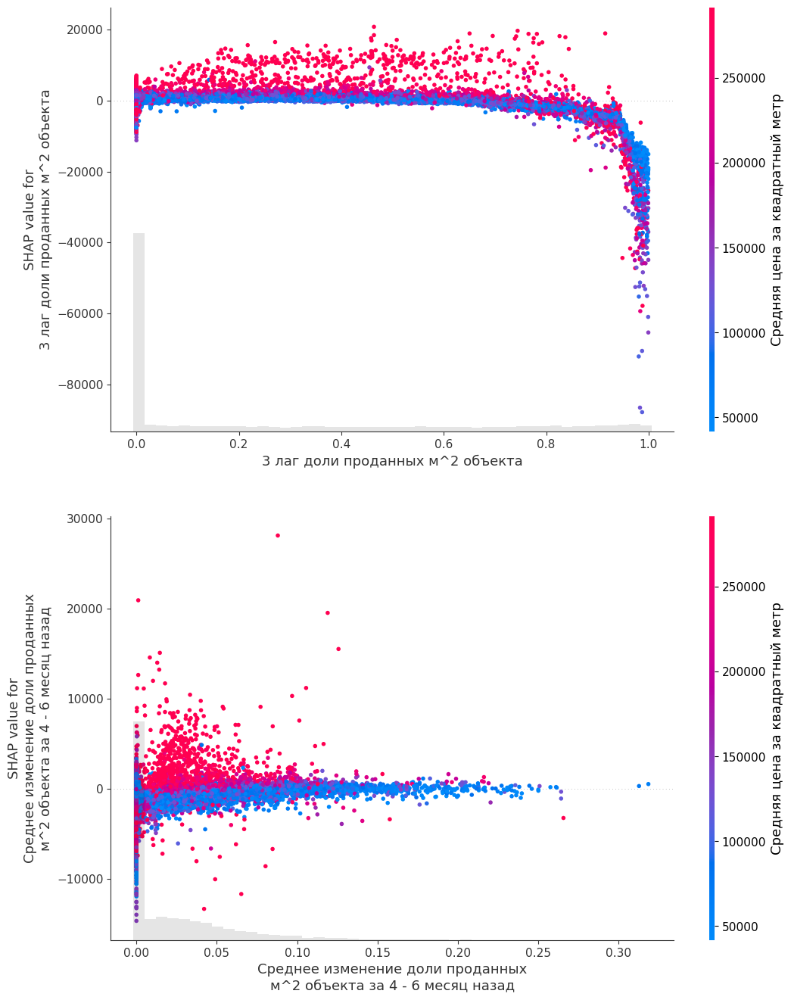

In [183]:
fig, axs = plt.subplots(2, 1, figsize = (12, 16))
 
get_shap_scatter(exp, '3 лаг доли проданных м^2 объекта', ax = axs[0])
get_shap_scatter(exp, 'Среднее изменение доли проданных\nм^2 объекта за 4 - 6 месяц назад', ax = axs[1])
fig.savefig('sales.png', dpi = 500)

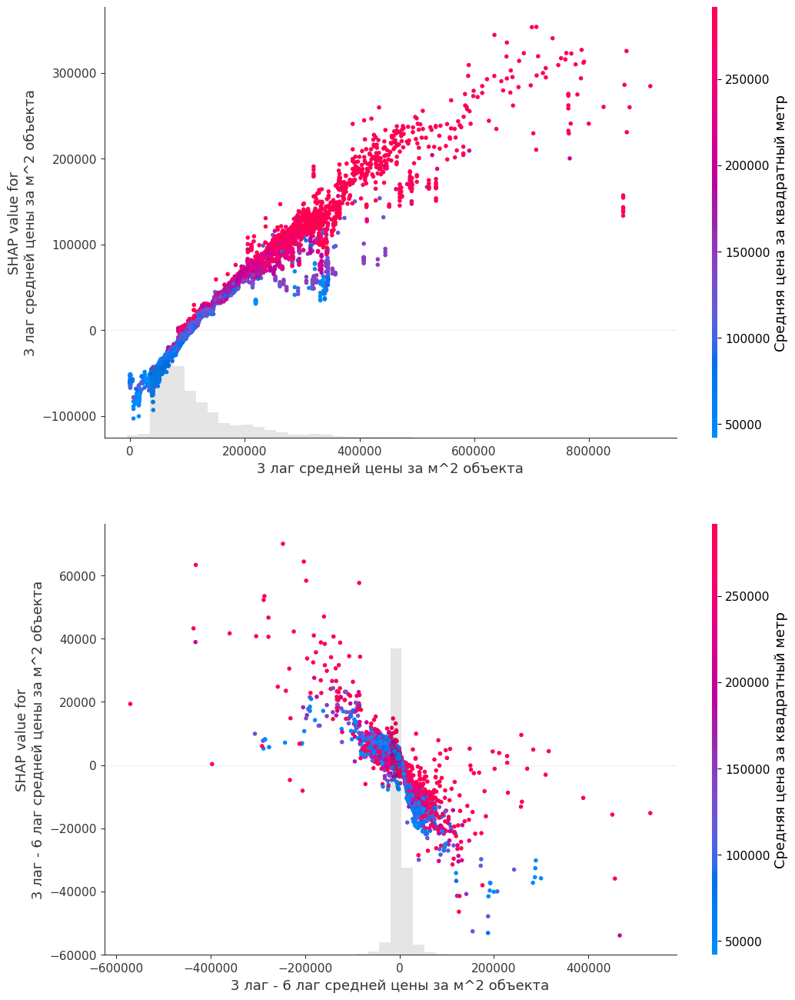

In [184]:
fig, axs = plt.subplots(2, 1, figsize = (12, 16))
 
get_shap_scatter(exp, '3 лаг средней цены за м^2 объекта', ax = axs[0])
get_shap_scatter(exp, '3 лаг - 6 лаг средней цены за м^2 объекта', ax = axs[1])
fig.savefig('price.png', dpi = 500)

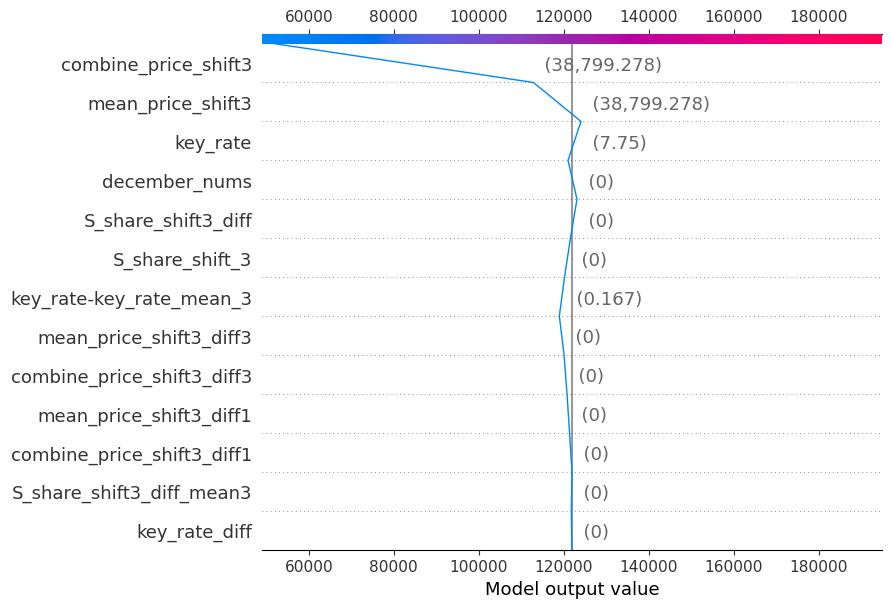

In [36]:
shap.initjs()
shap.decision_plot(explainer.expected_value, 
                shap_values[3,:], X_train.iloc[3,:])

In [125]:
step = 1
res_list = []
step = 1
res_list = []
for model, idxs in zip(iter_scores[1], CustomSplit(df_train)):
    for i, train_flg in enumerate([True, False]):
        res = pd.DataFrame({'report_date': df_train.iloc[idxs[i]]['report_date'].values,
                  'object': df_train.iloc[idxs[i]]['objectid'].values,
                  'fact': np.exp(df_train.iloc[idxs[i]]['target_price_pm'].values) - 1, 
                  'pred': np.exp(model.predict(X_train.iloc[idxs[i], :])) - 1,
                  'fact_ln': df_train.iloc[idxs[i]]['target_price_pm'].values, 
                  'pred_ln': model.predict(X_train.iloc[idxs[i], :]),
                  'step': step,
                  'train_flg': train_flg})
        res_list.append(res)
    step += 1
res = pd.concat(res_list)

overflow encountered in exp
overflow encountered in exp


In [126]:
res

,report_date,object,fact,pred,fact_ln,pred_ln,step,train_flg
0,2019-01-31,1802.0,inf,inf,53990.157676,57838.329425,1,True
1,2019-01-31,29753.0,inf,inf,84613.095915,84342.554278,1,True
2,2019-01-31,22768.0,inf,inf,63863.710145,84187.070770,1,True
3,2019-01-31,43251.0,inf,inf,62906.112512,127798.764531,1,True
4,2019-01-31,34372.0,inf,inf,76819.354839,92653.695885,1,True
...,...,...,...,...,...,...,...,...
577,2023-12-31,41215.0,inf,inf,195534.050623,154550.567080,5,False
578,2023-12-31,20623.0,inf,inf,188327.905199,180314.385877,5,False
579,2023-12-31,41978.0,inf,inf,456896.528049,507924.928637,5,False
580,2023-12-31,41907.0,inf,inf,27781.128824,72768.136097,5,False


In [144]:
#for obj, df_ in list(res[res['train_flg'] == False].groupby('object'))[30:50]:
#    px.line(df_, x = 'report_date', y = ['fact_ln', 'pred_ln']).update_yaxes(rangemode = 'tozero').show()

In [137]:
res.to_parquet('price_res.parquet')

In [127]:
for flg in [False, True]:
    display(res[res['train_flg'] == flg].groupby('step').apply(lambda df: pd.Series({'mae': mae(df['fact_ln'], df['pred_ln'])})).append(
        pd.Series({'mae': mae(res[res['train_flg'] == flg]['fact_ln'], res[res['train_flg'] == flg]['pred_ln'])}, name = 'all')))

,mae
step,
1,20593.352774
2,22313.416457
3,19599.561540
4,19845.376230
5,19878.301975
all,20559.900895


,mae
step,
1,13235.623954
2,13538.810679
3,13883.175224
4,14089.451715
5,14125.345794
all,13800.709737


In [146]:
#for obj, df_ in list(res[res['train_flg'] == False].groupby('object').apply(lambda df: df if (df['fact_ln'] - df['pred_ln']).abs().max() > 10**5 
#                                                       else pd.DataFrame()).reset_index(drop = True).groupby('object')):
#    px.line(df_, x = 'report_date', y = ['fact_ln', 'pred_ln']).update_yaxes(rangemode = 'tozero').show()

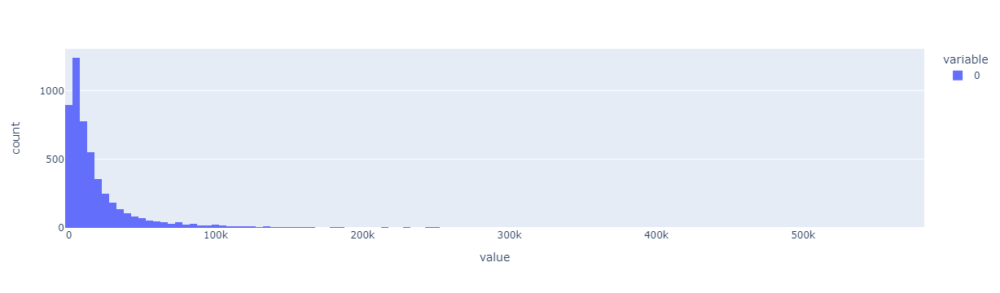

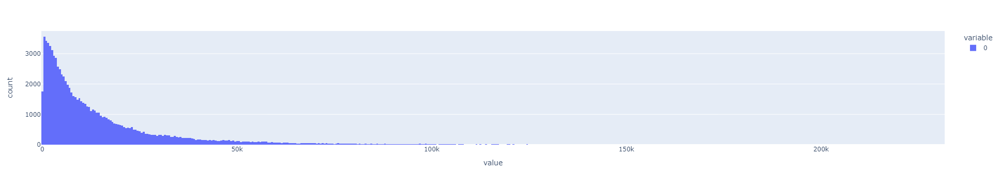

In [147]:
for flg in [False, True]:
    px.histogram((res[res['train_flg'] == flg]['fact_ln'] - res[res['train_flg'] == flg]['pred_ln']).abs()).show()

In [128]:
apply_metrics = lambda df: pd.Series({'rmse': mse(df['fact_ln'], df['pred_ln'])**(1/2),
                                      'rmedse': ((df['fact_ln'] - df['pred_ln'])**2).median()**(1/2),
                                      'mape': mape(df['fact_ln'], df['pred_ln']),
                                      'mae': mae(df['fact_ln'], df['pred_ln']),
                                      'medianae': (df['fact_ln'] - df['pred_ln']).abs().median(),
                                      'medianape': ((df['fact_ln'] - df['pred_ln']).abs() / df['fact_ln']).median()
                                    })



for flg in [False, True]:
    display(res[res['train_flg'] == flg].groupby('step').apply(apply_metrics)
        .append(
        apply_metrics(res[res['train_flg'] == flg]).rename('all')
        ))

,rmse,rmedse,mape,mae,medianae,medianape
step,,,,,,
1,36785.411705,10490.122783,0.193618,20593.352774,10490.110495,0.085564
2,40110.634391,10975.697493,0.171285,22313.416457,10975.693704,0.089892
3,37213.638248,9362.807180,0.125432,19599.561540,9362.798879,0.066769
4,41963.167510,9265.930232,0.139661,19845.376230,9265.906579,0.071026
5,42153.536394,10255.153376,0.120719,19878.301975,10255.138419,0.066918
all,39273.259928,10198.763421,0.156100,20559.900895,10198.763385,0.077084


,rmse,rmedse,mape,mae,medianae,medianape
step,,,,,,
1,20594.962033,8050.643439,0.152467,13235.623954,8050.643439,0.082176
2,21201.882121,8129.676529,0.153044,13538.810679,8129.676529,0.082079
3,21875.782109,8334.601274,0.154982,13883.175224,8334.601274,0.082215
4,22338.847005,8319.944583,0.154292,14089.451715,8319.944583,0.081944
5,22377.666120,8379.774641,0.153227,14125.345794,8379.774641,0.080744
all,21741.222050,8252.559341,0.153638,13800.709737,8252.559341,0.081801


In [132]:
mse(res['fact_ln'],res['pred_ln'])**(1/2)

25391.764989962256

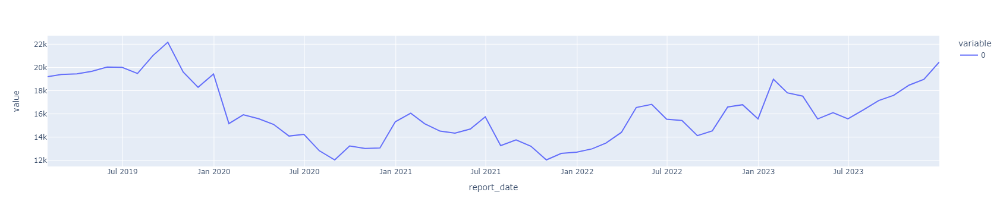

In [120]:
px.line(res.groupby('report_date').apply(lambda df: mae(df['fact_ln'], df['pred_ln'])))

In [133]:
res.groupby('step').apply(lambda df: mape([df['fact_ln']], [df['pred_ln']]))

step
1    0.173078
2    0.170019
3    0.167585
4    0.166222
5    0.165506
dtype: float64

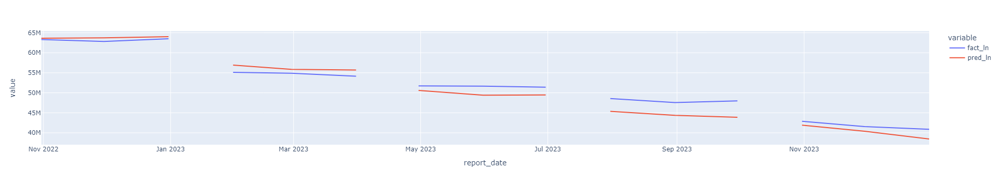

In [136]:
px.line(res[res['train_flg'] == False].groupby('report_date').agg({'step': 'first', 'fact_ln': 'sum', 'pred_ln': 'sum'}), line_group = 'step')

In [244]:
df_.index.values

array(['Дифференциал ключевой ставки',
       '3 лаг - 4 лаг индекса средней цены за м^2 объекта',
       'Число прошедших декабрей с даты получения РНС',
       '3 лаг - 4 лаг средней цены за м^2 объекта',
       'Среднее изменение доли проданных\nм^2 объекта за 4 - 6 месяц назад',
       'Ключевая ставка', '3 лаг - 4 лаг доли проданных м^2 объекта',
       '3 лаг - 6 лаг индекса средней цены за м^2 объекта',
       'Доля времени, прошедшей от даты\nполучения РНС к срочности проекта',
       'Количество месяцев до ввода объекта в эксплуатацию',
       'Изменение ключевой ставки по отношению\nк среднему значению за 3 предыдущих месяца',
       '3 лаг - 6 лаг средней цены за м^2 объекта',
       '3 лаг доли проданных м^2 объекта', 'Срочность проекта',
       '3 лаг индекса средней цены за м^2 для геолокации',
       '3 лаг средней цены за м^2 объекта'], dtype=object)

In [250]:
"{:,.0f}".format('aaa')

ValueError: Unknown format code 'f' for object of type 'str'

In [248]:
list(map(lambda x: "{:,.0f}".format(x), df_.index.values))

SyntaxError: f-string: empty expression not allowed (3886397652.py, line 1)

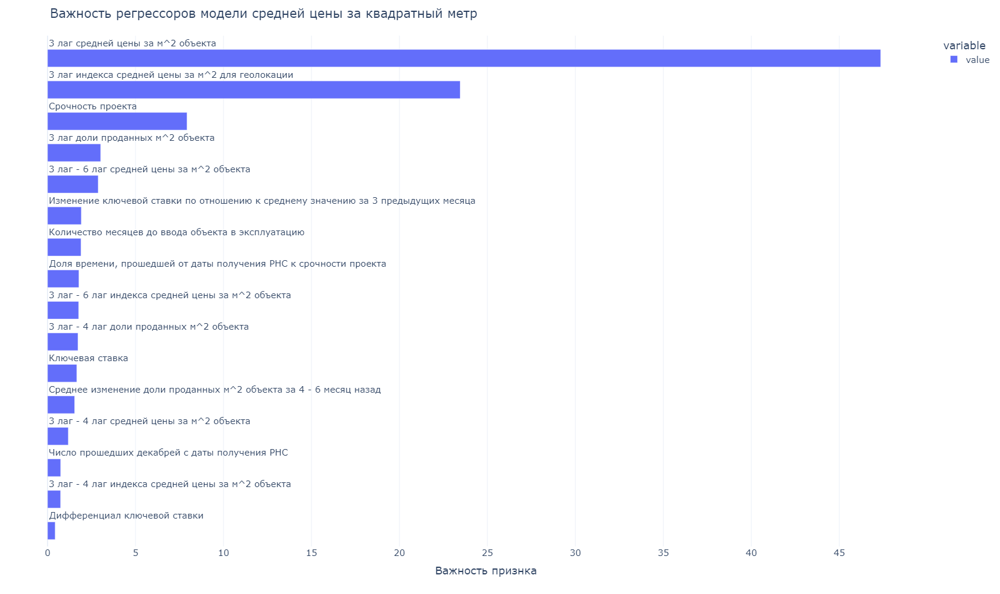

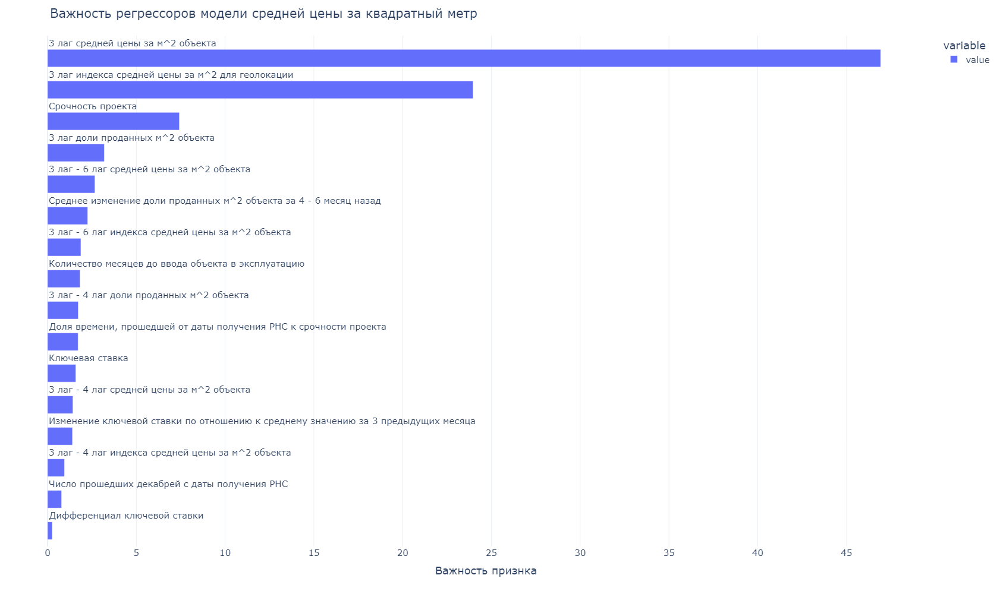

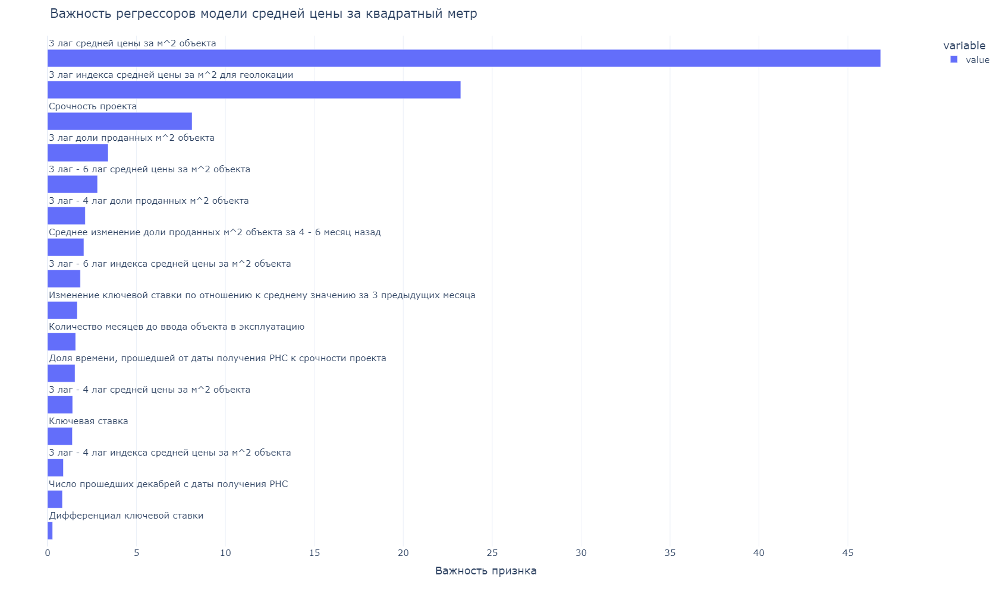

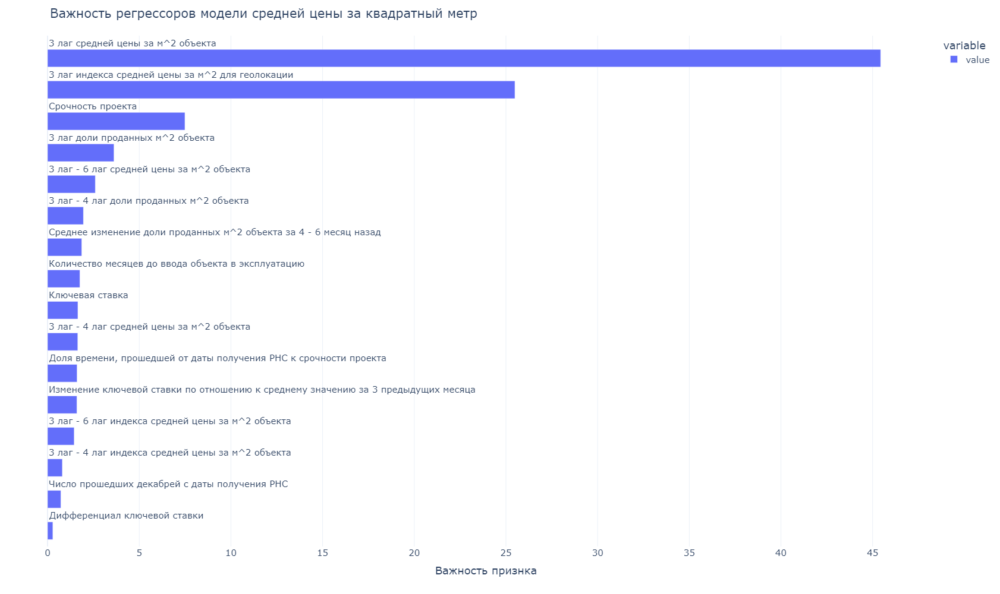

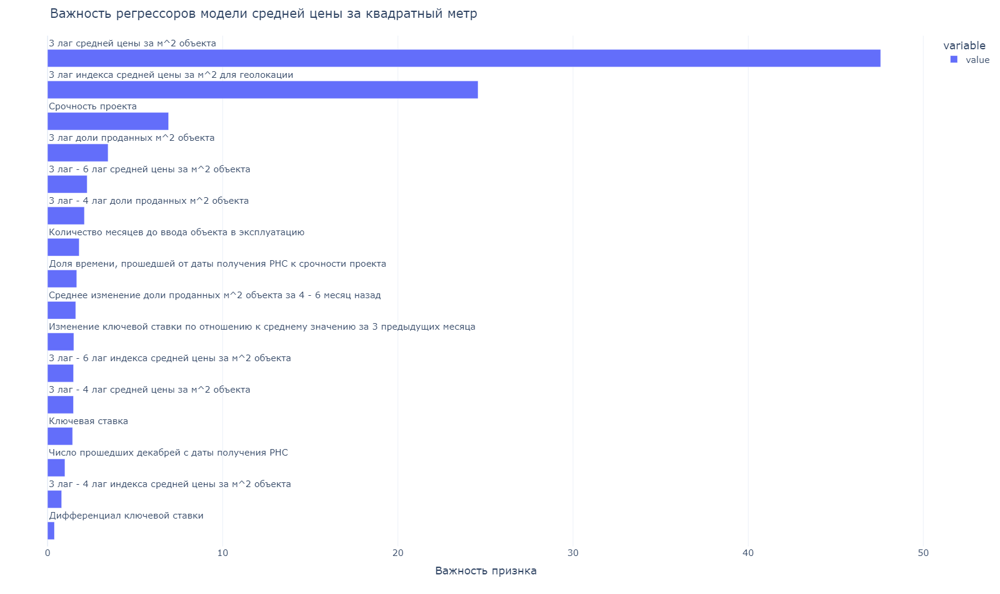

In [275]:
for model in iter_scores[1]:
    df_ = pd.DataFrame({'feature': ['Число прошедших декабрей с даты получения РНС',
                         'Ключевая ставка',
                         'Дифференциал ключевой ставки',
                         'Изменение ключевой ставки по отношению\nк среднему значению за 3 предыдущих месяца',
                         'Срочность проекта',
                         'Количество месяцев до ввода объекта в эксплуатацию',
                         'Доля времени, прошедшей от даты\nполучения РНС к срочности проекта',
                         '3 лаг средней цены за м^2 объекта',
                         '3 лаг индекса средней цены за м^2 для геолокации',
                         '3 лаг доли проданных м^2 объекта',
                         'Среднее изменение доли проданных\nм^2 объекта за 4 - 6 месяц назад',
                         '3 лаг - 4 лаг доли проданных м^2 объекта',
                         '3 лаг - 4 лаг средней цены за м^2 объекта',
                         '3 лаг - 6 лаг средней цены за м^2 объекта',
                         '3 лаг - 4 лаг индекса средней цены за м^2 объекта',
                         '3 лаг - 6 лаг индекса средней цены за м^2 объекта'
                         ], 'value': model.get_feature_importance()}).sort_values('value').set_index('feature')
    fig = px.bar(df_, template = 'plotly_white', orientation='h')
    fig.update_layout(font = dict(size = 15), bargroupgap = 0.3, yaxis = {'visible': False}, width = 1000, height = 1000, xaxis_title = 'Важность признка', 
                      title = 'Важность регрессоров модели средней цены за квадратный метр')
    for idx, name in enumerate(df_.index):
        fig.add_annotation(x = 0,  y = idx + 0.5, text = name, xanchor='left', showarrow=False, yshift=0)
        
        
    fig.show()

In [25]:
df_train

,report_date,objectid,december_nums,quartal,key_rate,key_rate_diff,key_rate-key_rate_mean_3,key_rate-key_rate_mean_6,key_rate-key_rate_mean_12,combine_price_shift3,mean_price_shift3,S_share_shift_3,combine_price_shift3_diff3,combine_price_shift3_diff6,combine_price_shift3_diff12,mean_price_shift3_diff3,mean_price_shift3_diff6,mean_price_shift3_diff12,target_price_pm
0,2019-01-31,1802.0,0,1,7.75,0.0,0.166667,0.291667,0.333333,49766.597215,49766.597215,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,53990.157676
1,2019-01-31,30979.0,0,1,7.75,0.0,0.166667,0.291667,0.333333,265240.805580,265240.805580,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,230989.806429
2,2019-01-31,30819.0,0,1,7.75,0.0,0.166667,0.291667,0.333333,42576.406068,42576.406068,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,41619.210884
3,2019-01-31,30812.0,0,1,7.75,0.0,0.166667,0.291667,0.333333,38799.277922,38799.277922,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,58248.308934
4,2019-01-31,30802.0,0,1,7.75,0.0,0.166667,0.291667,0.333333,44789.528997,44789.528997,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,53684.617564
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20826,2023-12-31,44854.0,2,4,16.00,0.0,1.666667,4.166667,6.333333,131385.639098,119492.789220,0.746098,21209.703735,22719.813854,23762.112988,0.000000e+00,0.000000e+00,-34.838293,113671.170612
20827,2023-12-31,42804.0,3,4,16.00,0.0,1.666667,4.166667,6.333333,206172.574412,130648.179111,0.748240,8371.008579,5792.498167,11793.307544,0.000000e+00,0.000000e+00,-2243.512184,220381.311821
20828,2023-12-31,43876.0,3,4,16.00,0.0,1.666667,4.166667,6.333333,108240.049751,128839.360403,1.000000,5499.352865,-5630.298692,-997.204626,-1.455192e-11,0.000000e+00,-6762.200721,108240.049751
20829,2023-12-31,43676.0,4,4,16.00,0.0,1.666667,4.166667,6.333333,98218.610648,93516.133836,0.986539,3655.850530,5104.927378,6374.429548,-1.455192e-11,-1.455192e-11,3140.346005,102728.857890
